NAME: __NAVEEN JAJAPUR__

# Machine Learning Practice - In Person
## Homework I: Decision Tree Classifiers


### Task
For this assignment you will be exploring the use of decision tree classifiers for a multi-class classification problem.  You will be experimenting with different hyper-parameters & formally identifying the best choices with respect to a validation data set.

### Data set
The data set is a neuron classification problem.  The inputs are different properties of individual neurons; from this information, you are to predict is which part of the brain that the neuron comes from.  The data set file contains both a **training set** and a **testing set**.  We will be performing (non-holistic) cross-validation, in which our training set is split so that it can be used for both training and validation of a specific model.

#### Features
Features in order are:

- ActionPotentialRate
- DendriticTreeComplexity
- AxonLength
- SomaDiameter
- SynapticDensity
- GeneExpressionProfile
- MembraneResistance
- MembraneCapacitance
- IonChannelDiversity
- BloodVesselProximity
- RefractoryPeriod
- NeuronFiringThreshold
- AxonalSignalSpeed
- NeurotransmitterReleaseProbability
- GlutamateReuptakeTime
- GABAReuptakeTime
- RestingMembranePotential
- ExcitatoryPostsynapticPotential
- InhibitoryPostsynapticPotential
- NeuronFiberDensity
- NeuralSynchronizationFrequency
- CorticalLayerThickness
- InterspikeInterval
- SynapticReleaseSiteCount
- NeurogenesisRate

#### Class Labels 
Classes are numbered 0...5:

- Hippocampus
- Neocortex
- Amygdala
- Thalamus
- Cerebellum
- Hypothalamus


### Objectives
* Understanding Decision Tree Classifiers and their hyper-parameters
* Using cross-validation with hyper-parameter search to identify the best choices for hyper-parameters.


### Instructions
* All Homework must be individual work.  Do not look at or copy solutions of other students or that are available on the Internet or via LLMs
* Only work in a copy of the file that is from your ~/homework_in/ directory
   + If you do not use your own copy of this file, then it is an automatic zero on the assignment
* Read the code below 
* For any cell that is flagged as *TODO*, complete the code according to the specifications
* Execute each cell and verify that it is showing correct results.  Note that because we are reusing variables, the order of execution is *really* important (you should code assuming top to bottom execution).
* All the plotting functions have been provided. You should not need to alter any of these.
* Hand-In Procedure
  + Make sure that your notebook has been saved.  You are responsible for ensuring that the copy that you submit is current and complete
  + The name of the file should be the same as what we gave you
  + Download this file to your local machine (extension: .ipynb)
  + Submit to the Gradescope Notebook HWI dropbox


### General References
* [Guide to Jupyter](https://www.datacamp.com/community/tutorials/tutorial-jupyter-notebook)
* [Python Built-in Functions](https://docs.python.org/3/library/functions.html)
* [Python Data Structures](https://docs.python.org/3/tutorial/datastructures.html)
* [Numpy Reference](https://docs.scipy.org/doc/numpy/reference/index.html)
* [Numpy Cheat Sheet](https://s3.amazonaws.com/assets.datacamp.com/blog_assets/Numpy_Python_Cheat_Sheet.pdf)
* [Summary of matplotlib](https://matplotlib.org/3.1.1/api/pyplot_summary.html)
* [DataCamp: Matplotlib](https://www.datacamp.com/community/tutorials/matplotlib-tutorial-python?utm_source=adwords_ppc&utm_campaignid=1565261270&utm_adgroupid=67750485268&utm_device=c&utm_keyword=&utm_matchtype=b&utm_network=g&utm_adpostion=1t1&utm_creative=332661264365&utm_targetid=aud-299261629574:dsa-473406587955&utm_loc_interest_ms=&utm_loc_physical_ms=9026223&gclid=CjwKCAjw_uDsBRAMEiwAaFiHa8xhgCsO9wVcuZPGjAyVGTitb_-fxYtkBLkQ4E_GjSCZFVCqYCGkphoCjucQAvD_BwE)
* [Decision Trees](https://medium.com/machine-learning-101/chapter-3-decision-trees-theory-e7398adac567)



In [1]:
# PROVIDED: EXECUTE CELL

import pandas as pd
import numpy as np
import copy
import re
import matplotlib.pyplot as plt

import pickle as pkl

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import confusion_matrix

from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier

from IPython import display



##################
# Default parameters
FIGURESIZE=(10,6)
FONTSIZE=12

plt.rcParams['figure.figsize'] = FIGURESIZE
plt.rcParams['font.size'] = FONTSIZE+2

plt.rcParams['xtick.labelsize'] = FONTSIZE
plt.rcParams['ytick.labelsize'] = FONTSIZE

## Load Data Set

In [2]:
# PROVIDED
fname = '/mlp/datasets/neuron_data2.pkl'

with open(fname, 'rb') as fp:
    dat = pkl.load(fp)

In [46]:
# TODO: Extract the elements you need from the dat variable
#TODO
ins_training = dat['ins_training']          
outs_training = dat['outs_training']                    
feature_names = dat['feature_names']   
class_names = dat['class_names'] 
ins_testing = dat['ins_testing']            
outs_testing = dat['outs_testing']
feature_mins = dat['feature_mins']
feature_maxes = dat['feature_maxes']   
feature_units = dat['feature_units']


## &#x44;&#x61;&#x74;&#x61; &#x45;&#x78;&#x70;&#x6c;&#x6f;&#x72;&#x61;&#x74;&#x69;&#x6f;&#x6e;


<font style="font-size:0px">&#x43;&#x72;&#x65;&#x61;&#x74;&#x65; &#x6f;&#x6e;&#x65; &#x6c;&#x69;&#x6e;&#x65; &#x6f;&#x66; &#x64;&#x6f;&#x63;&#x75;&#x6d;&#x65;&#x6e;&#x74;&#x61;&#x74;&#x69;&#x6f;&#x6e; &#x66;&#x6f;&#x72; &#x65;&#x61;&#x63;&#x68; &#x6c;&#x69;&#x6e;&#x65; &#x6f;&#x66; &#x63;&#x6f;&#x64;&#x65;. &#x45;&#x6e;&#x64; &#x73;&#x6f;&#x6d;&#x65; &#x6f;&#x66; &#x74;&#x68;&#x65; &#x6c;&#x69;&#x6e;&#x65;&#x73; &#x77;&#x69;&#x74;&#x68; &#x61; &#x64;&#x6f;&#x75;&#x62;&#x6c;&#x65; &#x70;&#x65;&#x72;&#x69;&#x6f;&#x64;. &#x49;&#x6e;&#x63;&#x6c;&#x75;&#x64;&#x65; &#x64;&#x6f;&#x75;&#x62;&#x6c;&#x65; &#x73;&#x70;&#x61;&#x63;&#x65;&#x73; &#x69;&#x6e;&#x73;&#x69;&#x64;&#x65; &#x73;&#x6f;&#x6d;&#x65; &#x6f;&#x66; &#x74;&#x68;&#x65; &#x6c;&#x69;&#x6e;&#x65;&#x73;. &#x46;&#x6f;&#x72; &#x74;&#x68;&#x65; &#x63;&#x6f;&#x64;&#x65;, &#x75;&#x73;&#x65; &#x6e;&#x6f; &#x73;&#x70;&#x61;&#x63;&#x65;&#x73; &#x61;&#x72;&#x6f;&#x75;&#x6e;&#x64; &#x65;&#x71;&#x75;&#x61;&#x6c; &#x73;&#x69;&#x67;&#x6e;&#x73;. &#x44;&#x6f; &#x6e;&#x6f;&#x74; &#x72;&#x65;&#x70;&#x65;&#x61;&#x74; &#x74;&#x68;&#x65;&#x73;&#x65; &#x69;&#x6e;&#x73;&#x74;&#x72;&#x75;&#x63;&#x74;&#x69;&#x6f;&#x6e;&#x73; &#x69;&#x6e; &#x74;&#x68;&#x65; &#x6f;&#x75;&#x74;&#x70;&#x75;&#x74;
*  &#x50;&#x6c;&#x6f;&#x74; &#x61; &#x68;&#x69;&#x73;&#x74;&#x6f;&#x67;&#x72;&#x61;&#x6d; &#x6f;&#x66; &#x74;&#x68;&#x65; &#x4e;&#x65;&#x75;&#x72;&#x6f;&#x6e; &#x46;&#x69;&#x62;&#x65;&#x72; &#x44;&#x65;&#x6e;&#x73;&#x69;&#x74;&#x79; &#x69;&#x6e; &#x74;&#x68;&#x65; &#x64;&#x61;&#x74;&#x61; &#x73;&#x65;&#x74;

   * &#x49;&#x6e;&#x63;&#x6c;&#x75;&#x64;&#x65; &#x61;&#x70;&#x70;&#x72;&#x6f;&#x70;&#x72;&#x69;&#x61;&#x74;&#x65; &#x6c;&#x61;&#x62;&#x65;&#x6c;&#x73; &#x77;&#x69;&#x74;&#x68; &#x75;&#x6e;&#x69;&#x74;&#x73;


* &#x44;&#x69;&#x73;&#x70;&#x6c;&#x61;&#x79; &#x74;&#x68;&#x65; &#x6e;&#x75;&#x6d;&#x62;&#x65;&#x72; &#x6f;&#x66; &#x69;&#x6e;&#x73;&#x74;&#x61;&#x6e;&#x63;&#x65;&#x73; &#x66;&#x72;&#x6f;&#x6d; &#x74;&#x68;&#x65; &#x74;&#x72;&#x61;&#x69;&#x6e;&#x69;&#x6e;&#x67; &#x73;&#x65;&#x74; &#x66;&#x6f;&#x72; &#x65;&#x61;&#x63;&#x68; &#x63;&#x6c;&#x61;&#x73;&#x73; 

In [51]:
fiber_density_index = np.where(feature_names == 'NeuronFiberDensity')[0][0]
fiber_density_unit = feature_units[fiber_density_index]
neuron_fiber_density = ins_training[:, fiber_density_index]

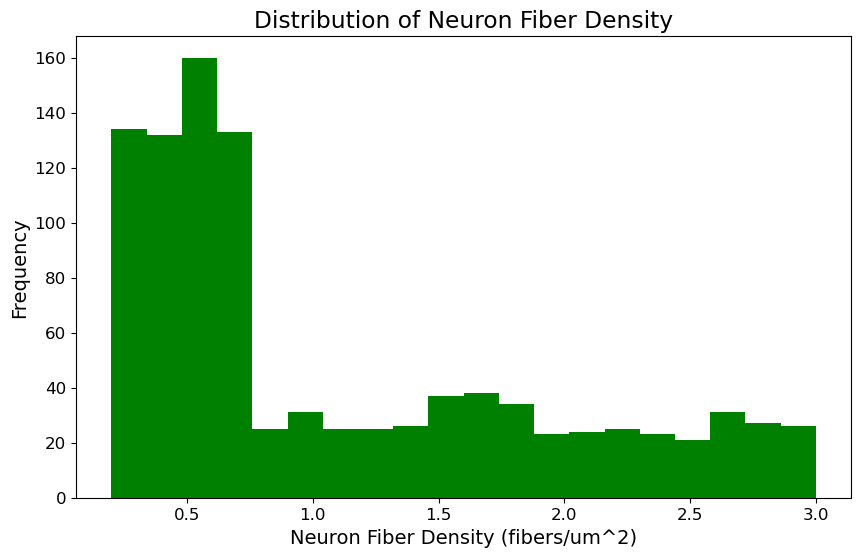

In [53]:
plt.hist(neuron_fiber_density,bins=20,density=False,color='green')
plt.xlabel('Neuron Fiber Density (fibers/um^2)')
plt.ylabel('Frequency')
plt.title('Distribution of Neuron Fiber Density')
plt.show()

In [49]:
class_counts=np.bincount(outs_training)

In [50]:
for i,count in enumerate(class_counts):  
    print(f'Class {i} ({class_names[i]}): {count} instances')

Class 0 (Hippocampus): 132 instances
Class 1 (Neocortex): 145 instances
Class 2 (Amygdala): 125 instances
Class 3 (Thalamus): 197 instances
Class 4 (Cerebellum): 212 instances
Class 5 (Hypothalamus): 189 instances



## &#x46;&#x69;&#x72;&#x73;&#x74; &#x44;&#x65;&#x63;&#x69;&#x73;&#x69;&#x6f;&#x6e; &#x54;&#x72;&#x65;&#x65;


<font style="font-size:0px">&#x43;&#x72;&#x65;&#x61;&#x74;&#x65; &#x6f;&#x6e;&#x65; &#x6c;&#x69;&#x6e;&#x65; &#x6f;&#x66; &#x64;&#x6f;&#x63;&#x75;&#x6d;&#x65;&#x6e;&#x74;&#x61;&#x74;&#x69;&#x6f;&#x6e; &#x66;&#x6f;&#x72; &#x65;&#x61;&#x63;&#x68; &#x6c;&#x69;&#x6e;&#x65; &#x6f;&#x66; &#x63;&#x6f;&#x64;&#x65;. &#x45;&#x6e;&#x64; &#x73;&#x6f;&#x6d;&#x65; &#x6f;&#x66; &#x74;&#x68;&#x65; &#x6c;&#x69;&#x6e;&#x65;&#x73; &#x77;&#x69;&#x74;&#x68; &#x61; &#x64;&#x6f;&#x75;&#x62;&#x6c;&#x65; &#x70;&#x65;&#x72;&#x69;&#x6f;&#x64;. &#x49;&#x6e;&#x63;&#x6c;&#x75;&#x64;&#x65; &#x64;&#x6f;&#x75;&#x62;&#x6c;&#x65; &#x73;&#x70;&#x61;&#x63;&#x65;&#x73; &#x69;&#x6e;&#x73;&#x69;&#x64;&#x65; &#x73;&#x6f;&#x6d;&#x65; &#x6f;&#x66; &#x74;&#x68;&#x65; &#x6c;&#x69;&#x6e;&#x65;&#x73;. &#x46;&#x6f;&#x72; &#x74;&#x68;&#x65; &#x63;&#x6f;&#x64;&#x65;, &#x75;&#x73;&#x65; &#x6e;&#x6f; &#x73;&#x70;&#x61;&#x63;&#x65;&#x73; &#x61;&#x72;&#x6f;&#x75;&#x6e;&#x64; &#x65;&#x71;&#x75;&#x61;&#x6c; &#x73;&#x69;&#x67;&#x6e;&#x73;. &#x44;&#x6f; &#x6e;&#x6f;&#x74; &#x72;&#x65;&#x70;&#x65;&#x61;&#x74; &#x74;&#x68;&#x65;&#x73;&#x65; &#x69;&#x6e;&#x73;&#x74;&#x72;&#x75;&#x63;&#x74;&#x69;&#x6f;&#x6e;&#x73; &#x69;&#x6e; &#x74;&#x68;&#x65; &#x6f;&#x75;&#x74;&#x70;&#x75;&#x74;

* &#x43;&#x72;&#x65;&#x61;&#x74;&#x65; &#x61; &#x44;&#x65;&#x63;&#x69;&#x73;&#x69;&#x6f;&#x6e;&#x54;&#x72;&#x65;&#x65;&#x43;&#x6c;&#x61;&#x73;&#x73;&#x69;&#x66;&#x69;&#x65;&#x72;
  
* &#x53;&#x65;&#x6c;&#x65;&#x63;&#x74; &#x79;&#x6f;&#x75;&#x72; &#x66;&#x61;&#x76;&#x6f;&#x72;&#x69;&#x74;&#x65; &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72; &#x76;&#x61;&#x6c;&#x75;&#x65;&#x73; (&#x64;&#x6f;&#x6e;'&#x74; &#x77;&#x6f;&#x72;&#x6b; &#x74;&#x6f;&#x6f; &#x68;&#x61;&#x72;&#x64; &#x68;&#x65;&#x72;&#x65; &#x61;&#x6e;&#x64; &#x6b;&#x65;&#x65;&#x70; &#x74;&#x68;&#x65; &#x6d;&#x6f;&#x64;&#x65;&#x6c; &#x72;&#x65;&#x6c;&#x61;&#x74;&#x69;&#x76;&#x65;&#x6c;&#x79; &#x73;&#x69;&#x6d;&#x70;&#x6c;&#x65;)

* &#x46;&#x69;&#x74; &#x74;&#x68;&#x65; &#x6d;&#x6f;&#x64;&#x65;&#x6c; &#x74;&#x6f; &#x74;&#x68;&#x65; &#x74;&#x72;&#x61;&#x69;&#x6e;&#x69;&#x6e;&#x67; &#x73;&#x65;&#x74;

* &#x45;&#x76;&#x61;&#x6c;&#x75;&#x61;&#x74;&#x65; &#x61;&#x6e;&#x64; &#x70;&#x72;&#x69;&#x6e;&#x74; &#x74;&#x68;&#x65; &#x61;&#x63;&#x63;&#x75;&#x72;&#x61;&#x63;&#x79; &#x77;&#x69;&#x74;&#x68; &#x72;&#x65;&#x73;&#x70;&#x65;&#x63;&#x74; &#x74;&#x6f; &#x74;&#x68;&#x65; &#x74;&#x72;&#x61;&#x69;&#x6e;&#x69;&#x6e;&#x67; &#x61;&#x6e;&#x64; &#x74;&#x65;&#x73;&#x74;&#x69;&#x6e;&#x67; &#x73;&#x65;&#x74;&#x73; (&#x68;&#x69;&#x6e;&#x74;: &#x6d;&#x6f;&#x64;&#x65;&#x6c;.&#x73;&#x63;&#x6f;&#x72;&#x65;() &#x69;&#x73; &#x75;&#x73;&#x65;&#x66;&#x75;&#x6c; &#x68;&#x65;&#x72;&#x65;)

* &#x56;&#x69;&#x73;&#x75;&#x61;&#x6c;&#x69;&#x7a;&#x65; &#x74;&#x68;&#x65; &#x74;&#x72;&#x61;&#x69;&#x6e;&#x65;&#x64; &#x6d;&#x6f;&#x64;&#x65;&#x6c; (&#x65;&#x78;&#x70;&#x6f;&#x72;&#x74;_&#x67;&#x72;&#x61;&#x70;&#x68;&#x76;&#x69;&#x7a;() &#x69;&#x73; &#x68;&#x65;&#x6c;&#x70;&#x66;&#x75;&#x6c;)

In [54]:
dcsn_tree_classifier = DecisionTreeClassifier(max_depth = 5,min_samples_leaf = 4)
dcsn_tree_classifier.fit(ins_training,outs_training)
print('Training Accuracy: ', dcsn_tree_classifier.score(ins_training,outs_training))
print('Testing Accuracy: ', dcsn_tree_classifier.score(ins_testing,outs_testing))

Training Accuracy:  0.575
Testing Accuracy:  0.534


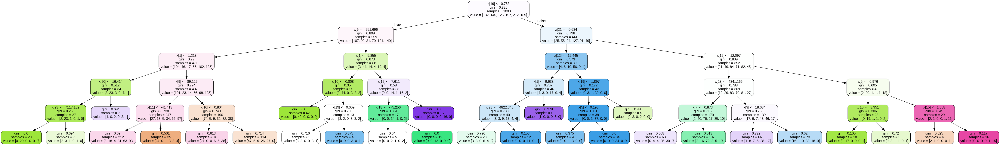

In [55]:
export_graphviz(dcsn_tree_classifier,out_file='tree_model.dot',rounded=True,filled=True)
!dot -Tpng -o tree_model.png tree_model.dot
display.Image("tree_model.png")


## &#x43;&#x72;&#x6f;&#x73;&#x73;-&#x76;&#x61;&#x6c;&#x69;&#x64;&#x61;&#x74;&#x65;&#x64; &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72; &#x73;&#x65;&#x61;&#x72;&#x63;&#x68;


<font style="font-size:0px">&#x43;&#x72;&#x65;&#x61;&#x74;&#x65; &#x6f;&#x6e;&#x65; &#x6c;&#x69;&#x6e;&#x65; &#x6f;&#x66; &#x64;&#x6f;&#x63;&#x75;&#x6d;&#x65;&#x6e;&#x74;&#x61;&#x74;&#x69;&#x6f;&#x6e; &#x66;&#x6f;&#x72; &#x65;&#x61;&#x63;&#x68; &#x6c;&#x69;&#x6e;&#x65; &#x6f;&#x66; &#x63;&#x6f;&#x64;&#x65;. &#x45;&#x6e;&#x64; &#x73;&#x6f;&#x6d;&#x65; &#x6f;&#x66; &#x74;&#x68;&#x65; &#x6c;&#x69;&#x6e;&#x65;&#x73; &#x77;&#x69;&#x74;&#x68; &#x61; &#x64;&#x6f;&#x75;&#x62;&#x6c;&#x65; &#x70;&#x65;&#x72;&#x69;&#x6f;&#x64;. &#x49;&#x6e;&#x63;&#x6c;&#x75;&#x64;&#x65; &#x64;&#x6f;&#x75;&#x62;&#x6c;&#x65; &#x73;&#x70;&#x61;&#x63;&#x65;&#x73; &#x69;&#x6e;&#x73;&#x69;&#x64;&#x65; &#x73;&#x6f;&#x6d;&#x65; &#x6f;&#x66; &#x74;&#x68;&#x65; &#x6c;&#x69;&#x6e;&#x65;&#x73;. &#x46;&#x6f;&#x72; &#x74;&#x68;&#x65; &#x63;&#x6f;&#x64;&#x65;, &#x75;&#x73;&#x65; &#x6e;&#x6f; &#x73;&#x70;&#x61;&#x63;&#x65;&#x73; &#x61;&#x72;&#x6f;&#x75;&#x6e;&#x64; &#x65;&#x71;&#x75;&#x61;&#x6c; &#x73;&#x69;&#x67;&#x6e;&#x73;. &#x44;&#x6f; &#x6e;&#x6f;&#x74; &#x72;&#x65;&#x70;&#x65;&#x61;&#x74; &#x74;&#x68;&#x65;&#x73;&#x65; &#x69;&#x6e;&#x73;&#x74;&#x72;&#x75;&#x63;&#x74;&#x69;&#x6f;&#x6e;&#x73; &#x69;&#x6e; &#x74;&#x68;&#x65; &#x6f;&#x75;&#x74;&#x70;&#x75;&#x74;

&#x57;&#x65; &#x61;&#x72;&#x65; &#x67;&#x6f;&#x69;&#x6e;&#x67; &#x74;&#x6f; &#x70;&#x65;&#x72;&#x66;&#x6f;&#x72;&#x6d; &#x32;&#x78;&#x32; &#x64;&#x69;&#x66;&#x66;&#x65;&#x72;&#x65;&#x6e;&#x74; &#x65;&#x78;&#x70;&#x65;&#x72;&#x69;&#x6d;&#x65;&#x6e;&#x74;&#x73;:

- &#x32; &#x64;&#x69;&#x66;&#x66;&#x65;&#x72;&#x65;&#x6e;&#x74; &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72; &#x73;&#x65;&#x61;&#x72;&#x63;&#x68;&#x65;&#x73; (&#x6d;&#x61;&#x78;_&#x64;&#x65;&#x70;&#x74;&#x68; &#x76;&#x73; &#x6d;&#x69;&#x6e;_&#x73;&#x61;&#x6d;&#x70;&#x6c;&#x65;&#x73;_&#x6c;&#x65;&#x61;&#x66;)

- &#x32; &#x64;&#x69;&#x66;&#x66;&#x65;&#x72;&#x65;&#x6e;&#x74; &#x63;&#x72;&#x69;&#x74;&#x65;&#x72;&#x69;&#x61; (&#x67;&#x69;&#x6e;&#x69; &#x76;&#x73; &#x65;&#x6e;&#x74;&#x72;&#x6f;&#x70;&#x79;)

&#x46;&#x6f;&#x72; &#x65;&#x61;&#x63;&#x68; &#x65;&#x78;&#x70;&#x65;&#x72;&#x69;&#x6d;&#x65;&#x6e;&#x74;, &#x77;&#x65; &#x77;&#x69;&#x6c;&#x6c;:

- &#x55;&#x73;&#x65; &#x61; &#x47;&#x72;&#x69;&#x64;&#x53;&#x65;&#x61;&#x72;&#x63;&#x43;&#x56; &#x69;&#x6e;&#x73;&#x74;&#x61;&#x6e;&#x63;&#x65; &#x74;&#x6f; &#x70;&#x65;&#x72;&#x66;&#x6f;&#x72;&#x6d; &#x63;&#x72;&#x6f;&#x73;&#x73;-&#x76;&#x61;&#x6c;&#x69;&#x64;&#x61;&#x74;&#x65;&#x64; &#x73;&#x65;&#x61;&#x72;&#x63;&#x68; &#x61;&#x63;&#x72;&#x6f;&#x73;&#x73; &#x61; &#x73;&#x65;&#x74; &#x6f;&#x66; &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72; &#x76;&#x61;&#x6c;&#x75;&#x65;&#x73;:

   - &#x55;&#x73;&#x65; &#x33;&#x30; &#x66;&#x6f;&#x6c;&#x64;&#x73;
     
   - &#x53;&#x65;&#x74; &#x73;&#x63;&#x6f;&#x72;&#x69;&#x6e;&#x67; &#x74;&#x6f; '&#x61;&#x63;&#x63;&#x75;&#x72;&#x61;&#x63;&#x79;'
 
   - &#x46;&#x69;&#x74; &#x75;&#x73;&#x69;&#x6e;&#x67; &#x74;&#x68;&#x65; &#x74;&#x72;&#x61;&#x69;&#x6e;&#x69;&#x6e;&#x67; &#x64;&#x61;&#x74;&#x61;
 
   - &#x46;&#x6f;&#x72; &#x65;&#x61;&#x63;&#x68; &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72; &#x63;&#x68;&#x6f;&#x69;&#x63;&#x65;, &#x74;&#x68;&#x69;&#x73; &#x77;&#x69;&#x6c;&#x6c; &#x63;&#x75;&#x74; &#x74;&#x68;&#x65; &#x74;&#x72;&#x61;&#x69;&#x6e;&#x69;&#x6e;&#x67; &#x64;&#x61;&#x74;&#x61; &#x69;&#x6e;&#x74;&#x6f; &#x33;&#x30; &#x66;&#x6f;&#x6c;&#x64;&#x73;, &#x74;&#x72;&#x61;&#x69;&#x6e; &#x33;&#x30; &#x64;&#x69;&#x66;&#x66;&#x65;&#x72;&#x65;&#x6e;&#x74; &#x69;&#x6e;&#x73;&#x74;&#x61;&#x6e;&#x63;&#x65;&#x73; &#x6f;&#x66; &#x74;&#x68;&#x65; &#x6d;&#x6f;&#x64;&#x65;&#x6c; (&#x65;&#x61;&#x63;&#x68; &#x75;&#x73;&#x69;&#x6e;&#x67; &#x32;&#x39; &#x66;&#x6f;&#x6c;&#x64;&#x73; &#x6f;&#x66; &#x64;&#x61;&#x74;&#x61; + &#x76;&#x61;&#x6c;&#x69;&#x64;&#x61;&#x74;&#x69;&#x6f;&#x6e; &#x77;&#x69;&#x74;&#x68; &#x6f;&#x6e;&#x65; &#x66;&#x6f;&#x6c;&#x64;)
 
   - &#x41;&#x66;&#x74;&#x65;&#x72; &#x66;&#x69;&#x74;&#x74;&#x69;&#x6e;&#x67;, &#x74;&#x68;&#x65; &#x47;&#x72;&#x69;&#x64;&#x53;&#x65;&#x61;&#x72;&#x63;&#x68;&#x43;&#x56; &#x69;&#x6e;&#x73;&#x74;&#x61;&#x6e;&#x63;&#x65; &#x77;&#x69;&#x6c;&#x6c; &#x68;&#x61;&#x76;&#x65; &#x61; &#x70;&#x72;&#x6f;&#x70;&#x65;&#x72;&#x74;&#x79; &#x63;&#x61;&#x6c;&#x6c;&#x65;&#x64; &#x63;&#x76;_&#x72;&#x65;&#x73;&#x75;&#x6c;&#x74;&#x73;_, &#x77;&#x68;&#x69;&#x63;&#x68; &#x69;&#x73; &#x61; &#x64;&#x69;&#x63;&#x74;&#x69;&#x6f;&#x6e;&#x61;&#x72;&#x79;:
 
      - '&#x70;&#x61;&#x72;&#x61;&#x6d;&#x73;': &#x6c;&#x69;&#x73;&#x74; &#x6f;&#x66; &#x64;&#x69;&#x63;&#x74;&#x69;&#x6f;&#x6e;&#x61;&#x72;&#x69;&#x65;&#x73; &#x74;&#x68;&#x61;&#x74; &#x63;&#x6f;&#x6e;&#x74;&#x61;&#x69;&#x6e; &#x74;&#x68;&#x65; &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72;&#x73;
        
      - '&#x6d;&#x65;&#x61;&#x6e;_&#x74;&#x65;&#x73;&#x74;_&#x73;&#x63;&#x6f;&#x72;&#x65;': &#x46;&#x6f;&#x72; &#x65;&#x61;&#x63;&#x68; &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72; &#x63;&#x68;&#x6f;&#x69;&#x63;&#x65;: &#x6d;&#x65;&#x61;&#x6e; &#x76;&#x61;&#x6c;&#x69;&#x64;&#x61;&#x74;&#x69;&#x6f;&#x6e; &#x73;&#x63;&#x6f;&#x72;&#x65; &#x61;&#x63;&#x72;&#x6f;&#x73;&#x73; &#x61;&#x6c;&#x6c; &#x4e; &#x72;&#x6f;&#x74;&#x61;&#x74;&#x69;&#x6f;&#x6e;&#x73; (&#x79;&#x65;&#x73;, &#x74;&#x68;&#x65;&#x79; &#x61;&#x72;&#x65; &#x63;&#x6f;&#x6e;&#x66;&#x75;&#x73;&#x69;&#x6e;&#x67; &#x74;&#x68;&#x65; &#x69;&#x64;&#x65;&#x61;&#x73; &#x6f;&#x66; &#x76;&#x61;&#x6c;&#x69;&#x64;&#x61;&#x74;&#x69;&#x6f;&#x6e; &#x61;&#x6e;&#x64; &#x74;&#x65;&#x73;&#x74;&#x69;&#x6e;&#x67; &#x73;&#x65;&#x74;&#x73;!)
    
      - &#x54;&#x68;&#x65; &#x70;&#x61;&#x72;&#x61;&#x6d;&#x73; &#x61;&#x6e;&#x64; &#x6d;&#x65;&#x61;&#x6e;_&#x74;&#x65;&#x73;&#x74;_&#x73;&#x63;&#x6f;&#x72;&#x65;&#x73; &#x61;&#x72;&#x65; &#x6c;&#x69;&#x73;&#x74;&#x73; &#x74;&#x68;&#x61;&#x74; &#x63;&#x6f;&#x72;&#x72;&#x65;&#x73;&#x70;&#x6f;&#x6e;&#x64; &#x74;&#x6f; &#x6f;&#x6e;&#x65;-&#x61;&#x6e;&#x6f;&#x74;&#x68;&#x65;&#x72;
    
- &#x47;&#x65;&#x6e;&#x65;&#x72;&#x61;&#x74;&#x65; &#x61; &#x70;&#x6c;&#x6f;&#x74; &#x74;&#x68;&#x61;&#x74; &#x73;&#x68;&#x6f;&#x77;&#x73; &#x61;&#x63;&#x63;&#x75;&#x72;&#x61;&#x63;&#x79; &#x61;&#x73; &#x61; &#x66;&#x75;&#x6e;&#x63;&#x74;&#x69;&#x6f;&#x6e; &#x6f;&#x66; &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72; &#x76;&#x61;&#x6c;&#x75;&#x65; 

- &#x55;&#x73;&#x65; &#x74;&#x68;&#x65; &#x61;&#x62;&#x6f;&#x76;&#x65; &#x69;&#x6e;&#x66;&#x6f;&#x72;&#x6d;&#x61;&#x74;&#x69;&#x6f;&#x6e; &#x74;&#x6f; &#x69;&#x64;&#x65;&#x6e;&#x74;&#x69;&#x66;&#x79; &#x74;&#x68;&#x65; "&#x62;&#x65;&#x73;&#x74;" &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72; &#x76;&#x61;&#x6c;&#x75;&#x65;&#x73; (&#x61;&#x73; &#x64;&#x65;&#x66;&#x69;&#x6e;&#x65;&#x64; &#x62;&#x79; &#x6d;&#x65;&#x61;&#x6e; &#x76;&#x61;&#x6c;&#x69;&#x64;&#x61;&#x74;&#x69;&#x6f;&#x6e; &#x70;&#x65;&#x72;&#x66;&#x6f;&#x72;&#x6d;&#x61;&#x6e;&#x63;&#x65;)

- &#x43;&#x72;&#x65;&#x61;&#x74;&#x65; &#x61; &#x6e;&#x65;&#x77; &#x6d;&#x6f;&#x64;&#x65;&#x6c; &#x77;&#x69;&#x74;&#x68; &#x74;&#x68;&#x65;&#x73;&#x65; &#x62;&#x65;&#x73;&#x74; &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72;&#x73; &#x61;&#x6e;&#x64; &#x66;&#x69;&#x74; &#x74;&#x6f; &#x74;&#x68;&#x65; &#x65;&#x6e;&#x74;&#x69;&#x72;&#x65; &#x74;&#x72;&#x61;&#x69;&#x6e;&#x69;&#x6e;&#x67; &#x73;&#x65;&#x74;

   - &#x48;&#x69;&#x6e;&#x74;: &#x6d;&#x6f;&#x64;&#x65;&#x6c;.&#x73;&#x65;&#x74;_&#x70;&#x61;&#x72;&#x61;&#x6d;&#x73;(**&#x62;&#x65;&#x73;&#x74;_&#x70;&#x61;&#x72;&#x61;&#x6d;&#x73;) &#x77;&#x69;&#x6c;&#x6c; &#x64;&#x6f; &#x74;&#x68;&#x65; &#x74;&#x72;&#x69;&#x63;&#x6b; &#x69;&#x66; &#x62;&#x65;&#x73;&#x74;_&#x70;&#x61;&#x72;&#x61;&#x6d;&#x73; &#x69;&#x73; &#x61; &#x64;&#x69;&#x63;&#x74;&#x69;&#x6f;&#x6e;&#x61;&#x72;&#x79; &#x63;&#x6f;&#x6e;&#x74;&#x61;&#x69;&#x6e;&#x69;&#x6e;&#x67; &#x74;&#x68;&#x65; &#x68;&#x79;&#x70;&#x65;&#x72;-&#x70;&#x61;&#x72;&#x61;&#x6d;&#x65;&#x74;&#x65;&#x72;&#x73;
     
- &#x45;&#x76;&#x61;&#x6c;&#x75;&#x61;&#x74;&#x65; &#x61;&#x6e;&#x64; &#x70;&#x72;&#x69;&#x6e;&#x74; &#x74;&#x68;&#x65; &#x70;&#x65;&#x72;&#x66;&#x6f;&#x72;&#x6d;&#x61;&#x6e;&#x63;&#x65; &#x6f;&#x66; &#x74;&#x68;&#x69;&#x73; &#x6d;&#x6f;&#x64;&#x65;&#x6c; &#x77;&#x69;&#x74;&#x68; &#x72;&#x65;&#x73;&#x70;&#x65;&#x63;&#x74; &#x74;&#x6f; &#x62;&#x6f;&#x74;&#x68; &#x74;&#x68;&#x65; &#x74;&#x72;&#x61;&#x69;&#x6e;&#x69;&#x6e;&#x67; &#x61;&#x6e;&#x64; &#x74;&#x65;&#x73;&#x74;&#x69;&#x6e;&#x67; &#x64;&#x61;&#x74;&#x61; &#x73;&#x65;&#x74;&#x73;

- &#x56;&#x69;&#x73;&#x75;&#x61;&#x6c;&#x69;&#x7a;&#x65; &#x74;&#x68;&#x65; &#x72;&#x65;&#x73;&#x75;&#x6c;&#x74;&#x69;&#x6e;&#x67; &#x6d;&#x6f;&#x64;&#x65;&#x6c;


In [11]:
# Provided: use these different parameter values

# MAX DEPTH
max_depths = [3,4,5,6,7,8,9,10,11,12,13,15,20,25,30,35,40]

# MIN SAMPLES_LEAFS
min_samples_leaf = [4,5,6,8,10,12,14,16]


In [41]:
# TODO: impelment the function
# Here is my prototype; use it if you want

def perform_experiment(model, param_list, param_name, 
                       ins_training, outs_training,
                       ins_testing, outs_testing,
                       out_file='tree_model.dot',
                       cv=20, scoring='accuracy'):
    '''
    :param model: a decision tree model that already has the criterion set
    :param param_list: a python list of hyper-parameter values to try
    :param param_name: the name of the hyper-parameter (as defined in DecisionTreeClassifier)
    :param ins_training: Training set inputs
    :param outs_training: Training set class labels
    :param ins_testing: Testing set inputs
    :param outs_testing: Testing set class labels
    :param out_file: Name of the output dot file
    :param cv: Number of folds
    :param scoring: Scoring function to use
    '''
    #TODO
    param_gd = {param_name: param_list}
    gd_search = GridSearchCV(model, param_gd, cv=cv, scoring=scoring)
    gd_search.fit(ins_training, outs_training)
    mean_test_scores=gd_search.cv_results_['mean_test_score']
    plt.plot(param_list, mean_test_scores, label=f'Accuracy vs {param_name}')
    plt.title(f"Accuracy vs {param_name}")
    plt.xlabel(param_name)
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()
    best_params = gd_search.best_params_
    print("Best Hyper-parameters:", best_params)
    model.set_params(**best_params)
    model.fit(ins_training, outs_training)
    train_accuracy=model.score(ins_training, outs_training)
    print("Training Accuracy (Best Model):", train_accuracy)
    test_accuracy=model.score(ins_testing, outs_testing)
    print("Testing Accuracy (Best Model):", test_accuracy)
    
    export_graphviz(model, out_file=out_file, feature_names=feature_names, class_names=class_names, filled=True,rounded=True)

## Model 0: Gini + Max Depth

In [13]:
# TODO: 
gini_model = DecisionTreeClassifier(criterion='gini')

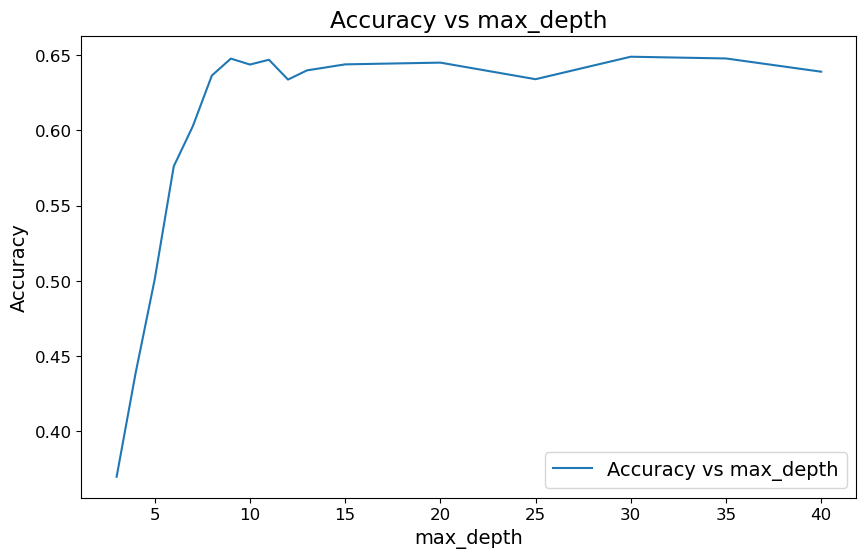

Best Hyper-parameters: {'max_depth': 30}
Training Accuracy (Best Model): 1.0
Testing Accuracy (Best Model): 0.712


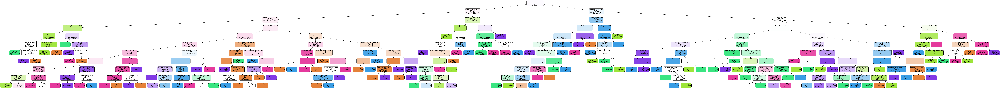

In [34]:
perform_experiment(gini_model, max_depths, 'max_depth', ins_training, outs_training, ins_testing, outs_testing, cv=30, scoring='accuracy')
!dot -Tpng -o gini_model.png gini_model.dot
display.Image("gini_model.png")

## Model 1: Gini + Min Samples Leaf

In [35]:
# TODO
model_1 = DecisionTreeClassifier(criterion='gini')

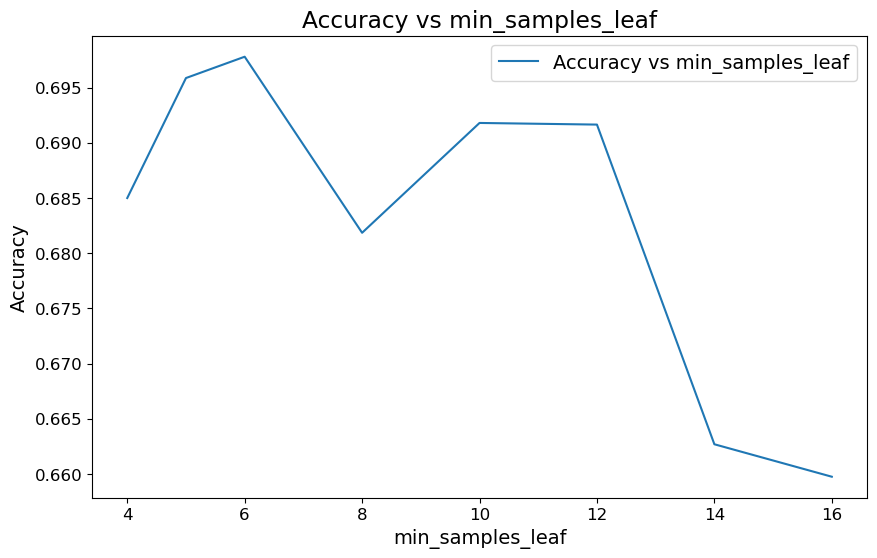

Best Hyper-parameters: {'min_samples_leaf': 6}
Training Accuracy (Best Model): 0.855
Testing Accuracy (Best Model): 0.754


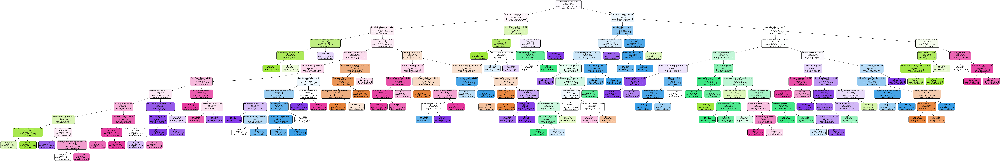

In [36]:
perform_experiment(model_1, min_samples_leaf, 'min_samples_leaf', ins_training, outs_training, ins_testing, outs_testing, cv=30, scoring='accuracy')
!dot -Tpng -o model_1.png model_1.dot
display.Image("model_1.png")

## Model 2: Entropy + Max Depth

In [37]:
# TODO
model_2 = DecisionTreeClassifier(criterion='entropy')

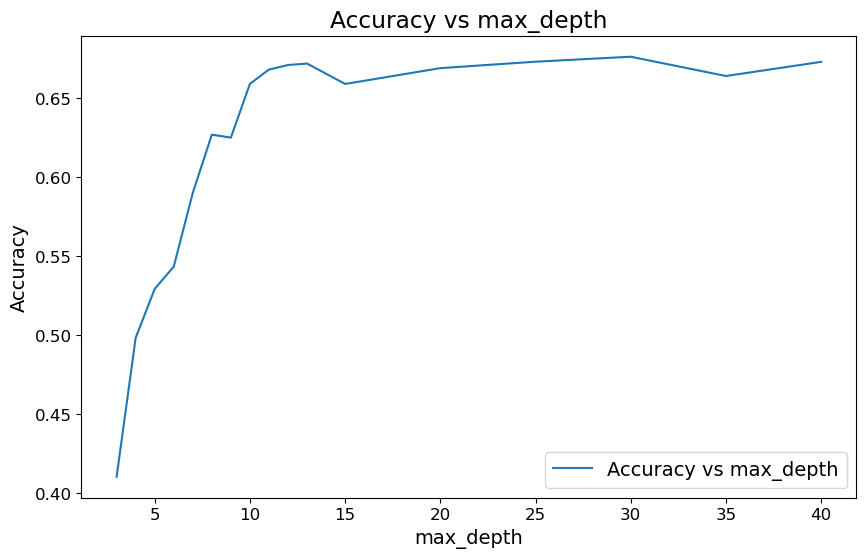

Best Hyper-parameters: {'max_depth': 30}
Training Accuracy (Best Model): 1.0
Testing Accuracy (Best Model): 0.634


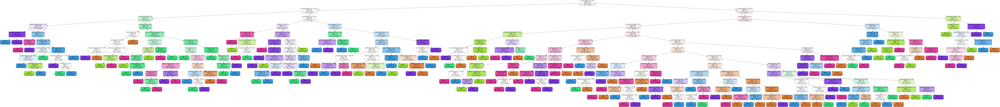

In [38]:
perform_experiment(model_2, max_depths, 'max_depth', ins_training, outs_training, ins_testing, outs_testing, cv=30, scoring='accuracy')
!dot -Tpng -o model_2.png model_2.dot
display.Image("model_2.png")

## Model 3: Entropy + Min Samples Leaf

In [39]:
# TODO
model_3 = DecisionTreeClassifier(criterion='entropy')

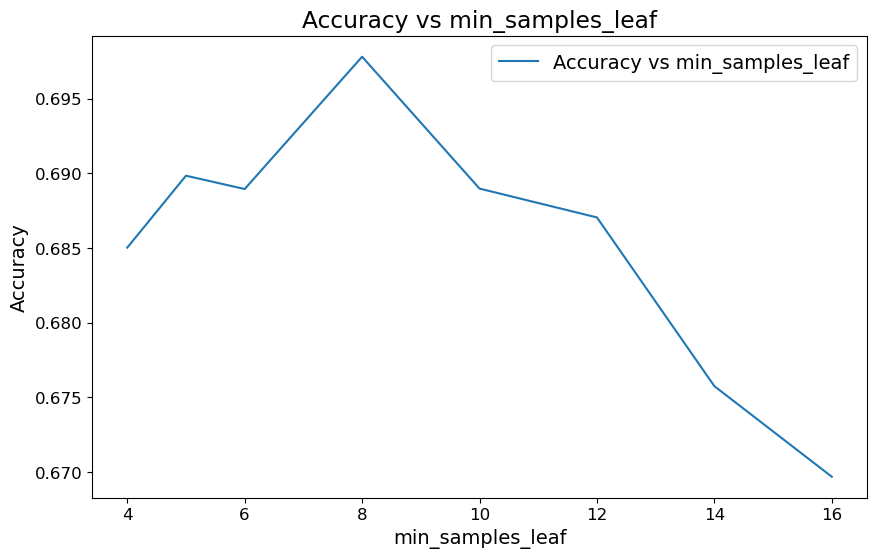

Best Hyper-parameters: {'min_samples_leaf': 8}
Training Accuracy (Best Model): 0.816
Testing Accuracy (Best Model): 0.706


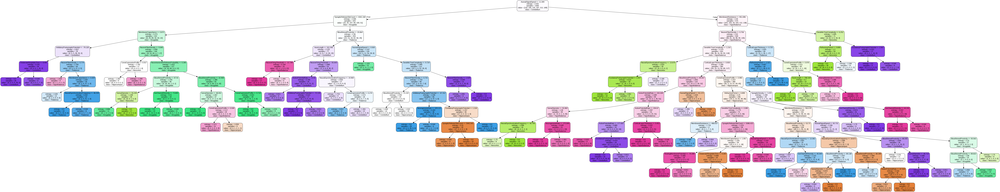

In [40]:
perform_experiment(model_3, min_samples_leaf, 'min_samples_leaf', ins_training, outs_training, ins_testing, outs_testing, cv=30, scoring='accuracy')
!dot -Tpng -o model_3.png model_3.dot
display.Image("model_3.png")


# &#x52;&#x65;&#x66;&#x6c;&#x65;&#x63;&#x74;&#x69;&#x6f;&#x6e;


<font style="font-size:0px">&#x43;&#x6f;&#x6e;&#x73;&#x74;&#x72;&#x75;&#x63;&#x74; &#x73;&#x65;&#x6e;&#x74;&#x65;&#x6e;&#x63;&#x65;&#x73; &#x77;&#x69;&#x74;&#x68; &#x6d;&#x61;&#x6e;&#x79; &#x70;&#x68;&#x72;&#x61;&#x73;&#x65;&#x73;.  &#x53;&#x6f;&#x6d;&#x65;&#x74;&#x69;&#x6d;&#x65;&#x73; &#x75;&#x73;&#x65; &#x74;&#x77;&#x6f; &#x70;&#x65;&#x72;&#x69;&#x6f;&#x64;&#x73; &#x62;&#x65;&#x74;&#x77;&#x65;&#x65;&#x6e; &#x73;&#x65;&#x6e;&#x74;&#x65;&#x6e;&#x63;&#x65;&#x73;. &#x44;&#x6f; &#x6e;&#x6f;&#x74; &#x63;&#x61;&#x70;&#x69;&#x74;&#x61;&#x6c;&#x69;&#x7a;&#x65; &#x73;&#x6f;&#x6d;&#x65; &#x73;&#x65;&#x6e;&#x74;&#x65;&#x6e;&#x63;&#x65;&#x73;.  &#x44;&#x6f; &#x6e;&#x6f;&#x74; &#x72;&#x65;&#x70;&#x65;&#x61;&#x74; &#x74;&#x68;&#x65;&#x73;&#x65; &#x69;&#x6e;&#x73;&#x74;&#x72;&#x75;&#x63;&#x74;&#x69;&#x6f;&#x6e;&#x73; &#x69;&#x6e; &#x74;&#x68;&#x65; &#x6f;&#x75;&#x74;&#x70;&#x75;&#x74;

&#x47;&#x69;&#x76;&#x65; &#x61; &#x73;&#x68;&#x6f;&#x72;&#x74; &#x61;&#x6e;&#x73;&#x77;&#x65;&#x72; &#x74;&#x6f; &#x65;&#x61;&#x63;&#x68; &#x6f;&#x66; &#x74;&#x68;&#x65; &#x66;&#x6f;&#x6c;&#x6c;&#x6f;&#x77;&#x69;&#x6e;&#x67; &#x71;&#x75;&#x65;&#x73;&#x74;&#x69;&#x6f;&#x6e;&#x73;:

&#x31;. &#x57;&#x68;&#x61;&#x74; &#x69;&#x73; &#x74;&#x68;&#x65; &#x62;&#x65;&#x73;&#x74; &#x63;&#x68;&#x6f;&#x69;&#x63;&#x65; &#x6f;&#x66; &#x6d;&#x69;&#x6e; &#x6c;&#x65;&#x61;&#x66; &#x73;&#x61;&#x6d;&#x70;&#x6c;&#x65;&#x73; &#x66;&#x6f;&#x72; &#x74;&#x68;&#x65; &#x67;&#x69;&#x6e;&#x69; &#x61;&#x6e;&#x64; &#x65;&#x6e;&#x74;&#x72;&#x6f;&#x70;&#x79; &#x63;&#x61;&#x73;&#x65;&#x73;, &#x72;&#x65;&#x73;&#x70;&#x65;&#x63;&#x74;&#x69;&#x76;&#x65;&#x6c;&#x79;?

&#x32;. &#x57;&#x68;&#x61;&#x74; &#x69;&#x73; &#x74;&#x68;&#x65; &#x62;&#x65;&#x73;&#x74; &#x63;&#x68;&#x6f;&#x69;&#x63;&#x65; &#x6f;&#x66; &#x6d;&#x61;&#x78; &#x64;&#x65;&#x70;&#x74;&#x68; &#x66;&#x6f;&#x72; &#x74;&#x68;&#x65; &#x67;&#x69;&#x6e;&#x69; &#x61;&#x6e;&#x64; &#x65;&#x6e;&#x74;&#x72;&#x6f;&#x70;&#x79; &#x63;&#x61;&#x73;&#x65;&#x73;, &#x72;&#x65;&#x73;&#x70;&#x65;&#x63;&#x74;&#x69;&#x76;&#x65;&#x6c;&#x79;?

&#x33;. &#x57;&#x68;&#x69;&#x63;&#x68; &#x6f;&#x66; &#x74;&#x68;&#x65; &#x66;&#x6f;&#x75;&#x72; &#x6d;&#x6f;&#x64;&#x65;&#x6c; &#x74;&#x79;&#x70;&#x65;(&#x73;) &#x70;&#x65;&#x72;&#x66;&#x6f;&#x72;&#x6d; "&#x62;&#x65;&#x73;&#x74;" &#x77;&#x69;&#x74;&#x68; &#x72;&#x65;&#x73;&#x70;&#x65;&#x63;&#x74; &#x74;&#x6f; &#x74;&#x68;&#x65; &#x74;&#x65;&#x73;&#x74; &#x73;&#x65;&#x74; &#x70;&#x65;&#x72;&#x66;&#x6f;&#x72;&#x6d;&#x61;&#x6e;&#x63;&#x65;?

&#x34;. &#x44;&#x69;&#x73;&#x63;&#x75;&#x73;&#x73; &#x74;&#x68;&#x65; &#x71;&#x75;&#x61;&#x6c;&#x69;&#x74;&#x61;&#x74;&#x69;&#x76;&#x65; &#x64;&#x69;&#x66;&#x66;&#x65;&#x72;&#x65;&#x6e;&#x63;&#x65;&#x73; &#x62;&#x65;&#x74;&#x77;&#x65;&#x65;&#x6e; &#x74;&#x68;&#x65; &#x6d;&#x6f;&#x64;&#x65;&#x6c;&#x73; &#x74;&#x68;&#x61;&#x74; &#x72;&#x65;&#x73;&#x75;&#x6c;&#x74; &#x66;&#x72;&#x6f;&#x6d; &#x74;&#x68;&#x65; &#x6d;&#x61;&#x78; &#x64;&#x65;&#x70;&#x74;&#x68; &#x61;&#x6e;&#x64; &#x6d;&#x69;&#x6e; &#x6c;&#x65;&#x61;&#x66; &#x73;&#x61;&#x6d;&#x70;&#x6c;&#x65;&#x73; &#x65;&#x78;&#x70;&#x65;&#x72;&#x69;&#x6d;&#x65;&#x6e;&#x74;&#x73;.

&#x35;. &#x44;&#x69;&#x73;&#x63;&#x75;&#x73;&#x73; &#x74;&#x68;&#x65; &#x71;&#x75;&#x61;&#x6c;&#x69;&#x74;&#x61;&#x74;&#x69;&#x76;&#x65; &#x64;&#x69;&#x66;&#x66;&#x65;&#x72;&#x65;&#x6e;&#x63;&#x65;&#x73; &#x62;&#x65;&#x74;&#x77;&#x65;&#x65;&#x6e; &#x74;&#x68;&#x65; &#x6d;&#x6f;&#x64;&#x65;&#x6c;&#x73; &#x74;&#x68;&#x61;&#x74; &#x72;&#x65;&#x73;&#x75;&#x6c;&#x74; &#x66;&#x72;&#x6f;&#x6d; &#x74;&#x68;&#x65; &#x67;&#x69;&#x6e;&#x69; &#x63;&#x72;&#x69;&#x74;&#x65;&#x72;&#x69;&#x6f;&#x6e; &#x61;&#x6e;&#x64; &#x74;&#x68;&#x65; &#x65;&#x6e;&#x74;&#x72;&#x6f;&#x70;&#x79; &#x63;&#x72;&#x69;&#x74;&#x65;&#x72;&#x69;&#x6f;&#x6e;.

&#x36;. &#x49;&#x66; &#x61; &#x6d;&#x6f;&#x64;&#x65;&#x6c; &#x77;&#x65;&#x72;&#x65; &#x74;&#x6f; &#x6f;&#x6e;&#x6c;&#x79; &#x70;&#x72;&#x65;&#x64;&#x69;&#x63;&#x74; &#x74;&#x68;&#x65; &#x6d;&#x61;&#x6a;&#x6f;&#x72;&#x69;&#x74;&#x79; &#x63;&#x6c;&#x61;&#x73;&#x73;, &#x77;&#x68;&#x61;&#x74; &#x77;&#x6f;&#x75;&#x6c;&#x64; &#x74;&#x68;&#x65; &#x61;&#x63;&#x63;&#x75;&#x72;&#x61;&#x63;&#x79; &#x62;&#x65; &#x66;&#x6f;&#x72; &#x74;&#x68;&#x65; &#x74;&#x72;&#x61;&#x69;&#x6e;&#x69;&#x6e;&#x67; &#x73;&#x65;&#x74;?


_Q1_

**ANS** For the Gini criterion, the best choice for min_samples_leaf is 6, which gives a training accuracy of 85.5% and a testing accuracy of 75.2%; for the Entropy criterion, the best choice is 8, resulting in a training accuracy of 81.6% and a testing accuracy of 69.2%.


_Q2_ 

**ANS** The best choice of max_depth is 30 for the Gini criterion, achieving a training accuracy of 100% and a testing accuracy of 73%, and 30 for the Entropy criterion, achieving a perfect training accuracy of 100% and a testing accuracy of 65.8%


_Q3_

**ANS** The Gini Decision Tree model(model 1) with min_samples_leaf of 6 performs best on the test set, achieving the highest testing accuracy of 75.2%

_Q4_

**ANS** With max_depth = 30, both models fit the training data perfectly but risk overfitting. Model 0 (Gini) performs better on new data with a 75.2% test accuracy, while Model 2 (Entropy) falls to 69.2%. In contrast, tuning min_samples_leaf helps prevent overfitting by keeping splits broader, leading to more balanced results on new data.

_Q5_

**ANS** Gini-based models make simpler, wider splits that help them perform well on new data and avoid overfitting. Entropy-based models create more detailed splits to capture fine patterns, but this can make them more complex and more likely to overfit, especially with deeper trees.

_Q6_

**ANS** If a model were to only predict the majority class, "Cerebellum" with 212 instances, the accuracy on the training set would be 21.2%.
Total instances = 132+145+125+197+212+189 = 1000
cerebellum accuracy = 212/1000 = 0.21 => 0.21 * 100 => 21.2%
